Цель: подготовить исследование рынка заведений общественного питания в Москве, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места для открытия нового заведения.  

Ход: 
1)Изучить пропуски

2)Избавиться от дубликатов

3)Изучить категоральные и колличественные данных на наличие проблем в данных 

4)Добавить 2 новых столбца 

5)Изучить категории заведений 

6)Проанализировать доли сетевых заведений 

7)Рассмотреть какие есть сетевые заведения 

8)Изучить распределение заведений по районам Москвы 

9)Изучить средние рейтинги категорий заведений, а также рейтинги заведений по районам 

10)Расположить уже существующие заведения на карте Москвы 

11)Рассмотреть улицы на которых больше всего и менее всего заведений общественного питания 

12)Более детально изучить данные, которые могут быть полезны для открытия кофейни 

13)Дать рекомендацию для открытия нового заведения 

14)Составить презентацию

Описание данных

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: 
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: 
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: 
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест;

street - название улицы, на которой находится заведение

is_24_7 - информация о работе заведения круглосуточно

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
display(data.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.shape[0]

8406

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Были импортированы библиотеки Python для работы с данными, вычислительных операций и визуализации анализа. Также были загруженны сами данные. И предварительно изучили данные, их типы.

В таблице представлены данные о название, категории, адресе, административном районе, часах работы, широте и долготе, рейтинге, ценах, средней цене заказа и средней сумме чека, цене за чашку капучино, является ли заведение частью сети и сколько в нем посадочных мест для каждого заведения в таблице. Всего в таблице 8406 различных заведений общественного питания.

In [6]:
data.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.063764
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.605639
avg_bill             0.546039
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

In [7]:
data[['hours', 'price', 'avg_bill']] = data[['hours', 'price', 'avg_bill']].fillna('Не известно')

In [8]:
data.isna().mean()

name                 0.000000
category             0.000000
address              0.000000
district             0.000000
hours                0.000000
lat                  0.000000
lng                  0.000000
rating               0.000000
price                0.000000
avg_bill             0.000000
middle_avg_bill      0.625387
middle_coffee_cup    0.936355
chain                0.000000
seats                0.429574
dtype: float64

In [9]:
data.duplicated().sum()

0

В таблице пропуски стобцах с количесвтвенными значениями нельзя заменить 0 так как эти значения будут важны для дальнейшего анализа. Пропуски в категоральных значениях были заменены на "Не известно". Также был проведен поиск дубликатов и в результвте него, явных дубликатов найдено не было.

In [10]:
data['name'].unique()

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

In [11]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [12]:
data['address'].unique()

array(['Москва, улица Дыбенко, 7/1', 'Москва, улица Дыбенко, 36, корп. 1',
       'Москва, Клязьминская улица, 15', ...,
       'Москва, улица Лобачевского, 52, корп. 1',
       'Москва, Болотниковская улица, 52, корп. 2',
       'Москва, Чонгарский бульвар, 26А, корп. 1'], dtype=object)

In [13]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [14]:
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [15]:
data['price'].unique()

array(['Не известно', 'выше среднего', 'средние', 'высокие', 'низкие'],
      dtype=object)

In [16]:
data['avg_bill'].unique()

array(['Не известно', 'Средний счёт:1500–1600 ₽',
       'Средний счёт:от 1000 ₽', 'Цена чашки капучино:155–185 ₽',
       'Средний счёт:400–600 ₽', 'Средний счёт:199 ₽',
       'Средний счёт:200–300 ₽', 'Средний счёт:от 500 ₽',
       'Средний счёт:1000–1200 ₽', 'Цена бокала пива:250–350 ₽',
       'Средний счёт:330 ₽', 'Средний счёт:1500 ₽',
       'Средний счёт:300–500 ₽', 'Средний счёт:140–350 ₽',
       'Средний счёт:350–500 ₽', 'Средний счёт:300–1500 ₽',
       'Средний счёт:от 240 ₽', 'Средний счёт:200–250 ₽',
       'Средний счёт:328 ₽', 'Средний счёт:300 ₽',
       'Средний счёт:от 345 ₽', 'Средний счёт:60–400 ₽',
       'Средний счёт:900 ₽', 'Средний счёт:500–800 ₽',
       'Средний счёт:500–1000 ₽', 'Средний счёт:600–700 ₽',
       'Цена бокала пива:120–350 ₽', 'Средний счёт:1000–1500 ₽',
       'Средний счёт:1500–2000 ₽', 'Цена чашки капучино:150–190 ₽',
       'Средний счёт:2000–2500 ₽', 'Средний счёт:600 ₽',
       'Средний счёт:450 ₽', 'Цена чашки капучино:120–170 ₽',
  

In [17]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [18]:
data['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [19]:
data['chain'].describe()

count    8406.000000
mean        0.381275
std         0.485729
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: chain, dtype: float64

In [20]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Был произведен анализ количественных и категоральных признаков в результе которого не было выявлено никаких явных проблем в данных.

In [21]:
data['street'] = data['address'].str.split(pat=', ', n=-1, expand=True)[1]

In [22]:
data['name'] = data['name'].str.lower()

In [23]:
data.duplicated().sum()

0

Неявные дубликаты могут находиться в колонке name, поэтому приведем все названия к одному регистру. После этого проверяем данные на наличие дубликатов. 

In [24]:
mask=data.duplicated(subset=['name', 'address', 'category'], keep=False)
display(data[mask])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,Не известно,Не известно,NaN,NaN,0,188.0,Волоколамское шоссе
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,Не известно,Не известно,NaN,NaN,1,188.0,Волоколамское шоссе


In [25]:
data = data.drop_duplicates(subset=['name', 'address', 'category'])

In [26]:
mask=data.duplicated(subset=['name', 'address', 'category'], keep=False)
display(data[mask])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street


Был найден один неявный дубликат, после чего дубликат был удален

In [27]:
data['is_24_7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)

In [28]:
display(data.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,Не известно,Не известно,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,Не известно,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Также в таблицу были добавлены два столбца с информацией о название улицы из столбца адреса и информации о круглосуточной работе заведения

Изучим заведения общественного питания какой категории преобладают в Москве.

In [29]:
df = data.groupby(['category'])[['name']].count().reset_index().rename(columns={'category':'Категория', 'name':'Количество заведений'}).sort_values(by='Количество заведений',ascending=False)
display(df)

,Категория,Количество заведений
3,кафе,2378
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


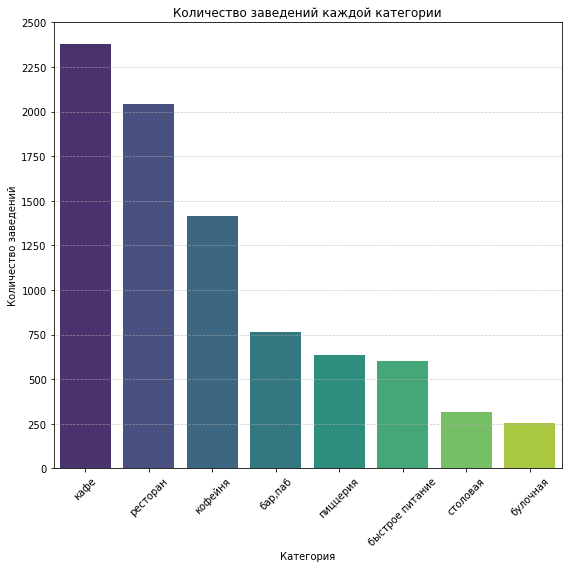

In [30]:
plt.figure(figsize=(8, 8))
sns.barplot(x='Категория', y='Количество заведений', data=df, palette='viridis')
plt.title('Количество заведений каждой категории')
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.xticks(rotation=45)
max_y = df['Количество заведений'].max()
plt.yticks(np.arange(0, max_y + 250, 250))
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.show()

Заведений по типу кафе и ресторанов в Москве на порядок больше чем других, также насчитывается большое количество кофеен. Скорее всего это связано с популярностью таких мест, так как туда можно придти и с комфортом отдохнуть и вкусно поесть никуда не торопясь.

Для того чтобы убедиться, что для многих клиентов важен комфорт и обстановка, изучим какие категории заведений наиболее удобны, а точнее где насчитывается большее число посадоы=чных мест.

In [31]:
md = data.groupby(['category'])[['seats']].sum().reset_index().rename(columns={'category':'Категория', 'seats':'Количество посадочных мест'}).sort_values(by='Количество посадочных мест', ascending=False)
display(md)

,Категория,Количество посадочных мест
6,ресторан,154681.0
3,кафе,118770.0
4,кофейня,83511.0
0,"бар,паб",58281.0
5,пиццерия,40350.0
2,быстрое питание,34513.0
7,столовая,16359.0
1,булочная,13229.0


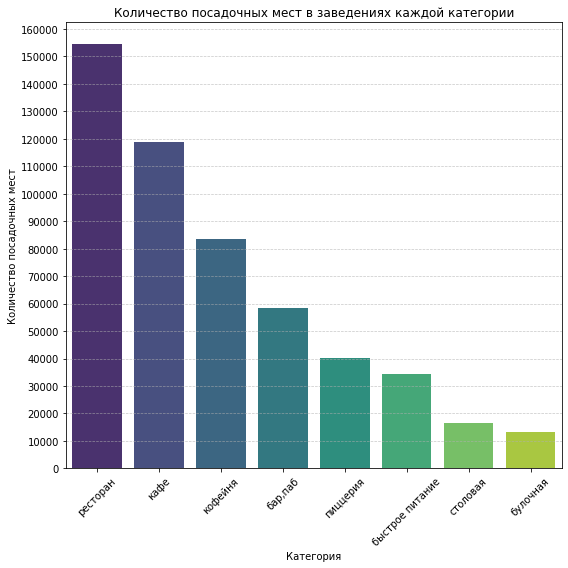

In [32]:
plt.figure(figsize=(8, 8))
sns.barplot(x='Категория', y='Количество посадочных мест', data=md, palette='viridis')
plt.title('Количество посадочных мест в заведениях каждой категории')
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категория')
plt.xticks(rotation=45)
max_y = md['Количество посадочных мест'].max()
plt.yticks(np.arange(0, max_y + 10000, 10000))
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.show()

Посадочных мест больше всего в заведениях категории кафе и рестораны, это связано в первую очередь с тем что таких заведений в целом больше по Москве, но такде они расчитаны на то что посетители приходят и с комфортом могут отдохнуть в их стенах.

Посмотрим на данные о том являются ли заведния сетевыми

In [33]:
nd = data.groupby(['chain'])[['name']].count().reset_index().rename(columns={'chain':'Сеть', 'name':'Количество заведений'})
display(nd)

,Сеть,Количество заведений
0,0,5201
1,1,3204


Не сетевых заведений в Москве на порядок больше, скорее всего это связано что многие просто открывают одно заведения и ждут пока она начнет приносить прибыль чтобы дальше расширяться, к тому же если делать сеть заведений это сложнее в плане документов.

In [34]:
fd = data.groupby(['category'])[['chain']].sum().reset_index().rename(columns={'category':'Категория', 'chain':'Количество сетевых заведений'})
fd['Доля сетевых заведений'] = fd['Количество сетевых заведений']/df['Количество заведений']*100
fd=fd.sort_values(by='Доля сетевых заведений', ascending=False)
display(fd)

,Категория,Количество сетевых заведений,Доля сетевых заведений
1,булочная,157,61.328125
5,пиццерия,330,52.132701
4,кофейня,720,50.955414
2,быстрое питание,232,38.474295
6,ресторан,729,35.700294
3,кафе,779,32.758621
7,столовая,88,27.936508
0,"бар,паб",169,22.091503


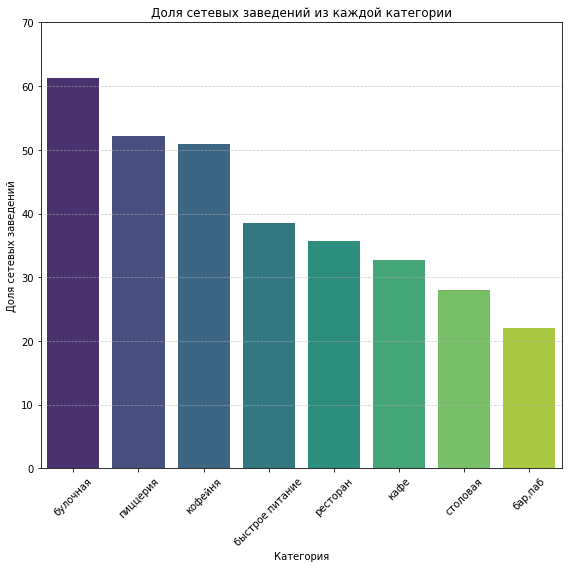

In [35]:
plt.figure(figsize=(8, 8))
sns.barplot(x='Категория', y='Доля сетевых заведений', data=fd, palette='viridis')
plt.title('Доля сетевых заведений из каждой категории')
plt.ylabel('Доля сетевых заведений')
plt.xlabel('Категория')
plt.xticks(rotation=45)
max_y = fd['Доля сетевых заведений'].max()
plt.yticks(np.arange(0, max_y + 10, 10))
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.show()

При анализе долей сетевых заведений, стало известно что большую долю сетевых заведений от общего чиисла заведений в категориив занимают булочные и также среди пиццерии и кофейни

Теперь же давайте изучим самые популярные сети общественного питания по количеству заведений. И посмотрим на возможные взаимосвязи между ними.

In [36]:
cd = data.groupby(['name', 'category'])[['rating']].count().reset_index().rename(columns={'name': 'Название заведения', 'category':'Категория заведения', 'rating':'Количество заведений с этим названием'}).sort_values(by = 'Количество заведений с этим названием', ascending = False).head(15)
display(cd)

,Название заведения,Категория заведения,Количество заведений с этим названием
3038,кафе,кафе,159
5870,шоколадница,кофейня,119
2713,домино'с пицца,пиццерия,77
2678,додо пицца,пиццерия,74
1202,one price coffee,кофейня,72
5946,яндекс лавка,ресторан,69
427,cofix,кофейня,65
1343,prime,ресторан,49
3415,кофепорт,кофейня,42
3479,кулинарная лавка братьев караваевых,кафе,39


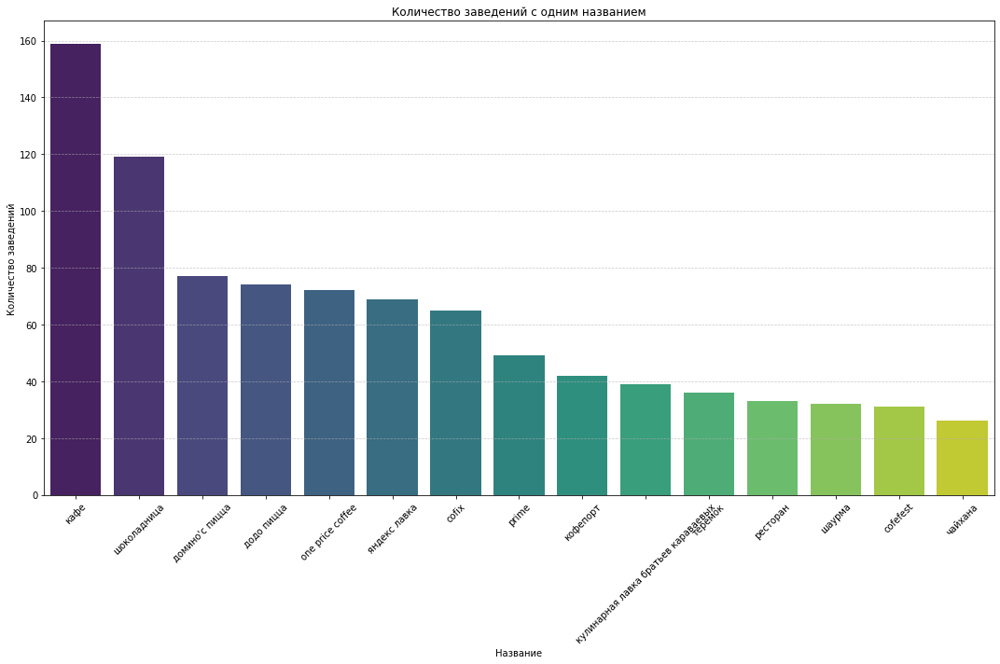

In [37]:
plt.figure(figsize=(15, 10))
sns.barplot(x='Название заведения', y='Количество заведений с этим названием', data=cd, palette='viridis')
plt.title('Количество заведений с одним названием')
plt.ylabel('Количество заведений')
plt.xlabel('Название')
plt.xticks(rotation=45)
max_y = cd['Количество заведений с этим названием'].max()
plt.yticks(np.arange(0, max_y + 20, 20))
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)
plt.tight_layout()
plt.show()

In [38]:
top = data.query("name in @cd['Название заведения']")
display(top)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
32,додо пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,Не известно,Средний счёт:328 ₽,328.0,NaN,1,46.0,Коровинское шоссе,False
34,домино'с пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,Не известно,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,Клязьминская улица,False
40,кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,Не известно,55.895115,37.524902,3.7,Не известно,Не известно,NaN,NaN,0,NaN,Ижорская улица,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,Не известно,Не известно,NaN,NaN,1,NaN,улица Маршала Федоренко,False
47,кафе,кафе,"Москва, улица Маршала Федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,Не известно,Не известно,NaN,NaN,0,35.0,улица Маршала Федоренко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7976,кафе,кафе,"Москва, МКАД, 19-й километр, вл12с1",Южный административный округ,Не известно,55.616980,37.779312,4.3,Не известно,Не известно,NaN,NaN,0,NaN,МКАД,False
7979,яндекс лавка,ресторан,"Москва, Шипиловский проезд, 65, корп. 1",Южный административный округ,"ежедневно, 07:00–00:00",55.599020,37.714239,3.5,Не известно,Не известно,NaN,NaN,1,75.0,Шипиловский проезд,False
7980,яндекс лавка,ресторан,"Москва, улица Маршала Захарова, 2",Южный административный округ,"ежедневно, 07:00–00:00",55.624112,37.707183,4.0,Не известно,Не известно,NaN,NaN,1,200.0,улица Маршала Захарова,False
7981,теремок,ресторан,"Москва, Каширское шоссе, 61Г",Южный административный округ,"ежедневно, 10:00–22:00",55.621939,37.713243,3.9,Не известно,Не известно,NaN,NaN,1,NaN,Каширское шоссе,False


Самой крупной сетья является кафе под названием "Кафе", на втором месте кофейня "Шоколадница" и третьей по популярности можно назвать сеть пиццерий "Домино'с Пицца". На первый взгляд нет очевидного общего признака, который объединял бы все эти сети. Некоторые из этих сетей распространены по всей России.

Рассмотрим какие административные округа присутствуют в нашем датасете. И заведения общепита находящиеся в них.

In [39]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [79]:
xd = data.groupby(['district'])[['name']].count().reset_index().rename(columns={'district':'Административный округ','name':'Общее количество заведений в этом административном округе'}).sort_values(by = 'Общее количество заведений в этом административном округе', ascending = False)
display(xd)

,Административный округ,Общее количество заведений в этом административном округе
5,Центральный административный округ,2242
2,Северный административный округ,899
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [41]:
gd = data.groupby(['district', 'category'])[['name']].count().reset_index().rename(columns={'district':'Административный округ','category':'Тип заведения','name':'Количество заведений категории в административном округе'})
display(gd)

,Административный округ,Тип заведения,Количество заведений категории в административном округе
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [42]:
pivot = (gd.pivot(index="Административный округ", columns="Тип заведения", values="Количество заведений категории в административном округе").fillna(0))

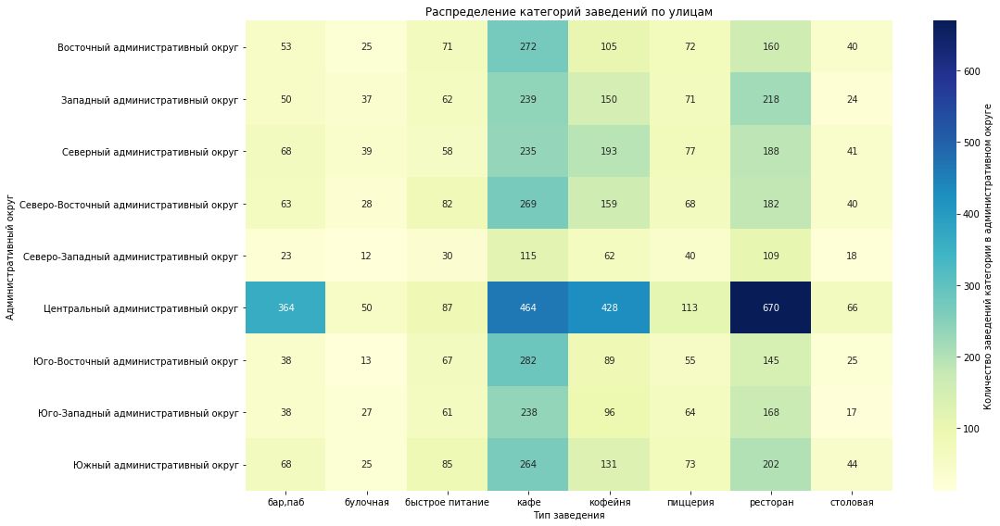

In [43]:
plt.figure(figsize=(16, 8))
sns.heatmap(
    pivot,
    annot=True, fmt=".0f", cmap="YlGnBu",
    cbar_kws={'label': 'Количество заведений категории в административном округе'}
)

plt.title("Распределение категорий заведений по улицам")
plt.xlabel("Тип заведения")
plt.ylabel("Административный округ")
plt.tight_layout()
plt.show()

Наибольшее количество разных заведений можно наблюдать в центральном районе. В нем число заведений общественного питания, намного превышает их количество в других районах Москвы.

Теперь же перейдем к основным критериям по которым клиенты выбирают заведение куда сходить.

In [44]:
rating_data = data.groupby(['category'])[['rating']].mean().reset_index().rename(columns={'category':'Тип заведения', 'rating':'Средний рейтинг заведений по категории'}).sort_values(by='Средний рейтинг заведений по категории', ascending=False)
display(rating_data)

,Тип заведения,Средний рейтинг заведений по категории
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290402
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


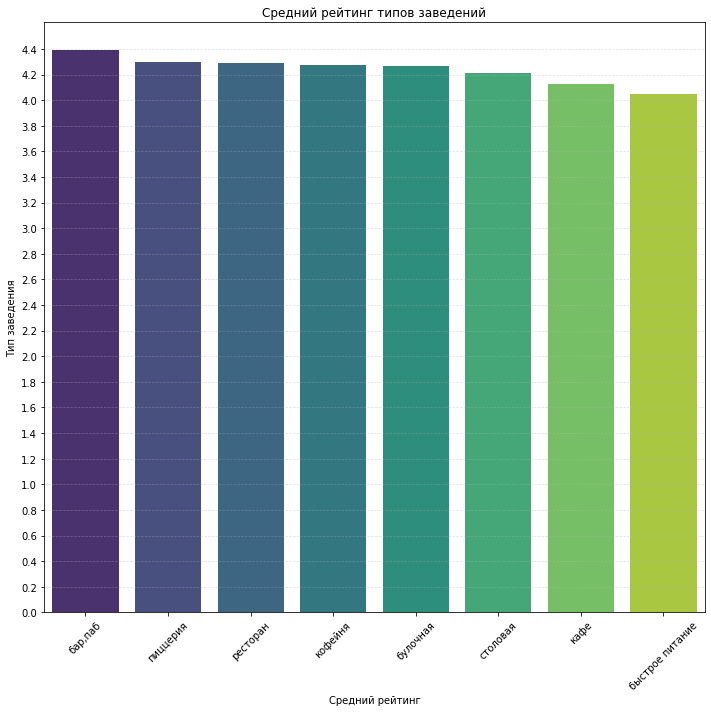

In [45]:
plt.figure(figsize=(10, 10))
sns.barplot(x='Тип заведения', y='Средний рейтинг заведений по категории', data=rating_data, palette='viridis')
plt.title('Средний рейтинг типов заведений')
plt.ylabel('Тип заведения')
plt.xlabel('Средний рейтинг')
plt.xticks(rotation=45)
max_y = rating_data['Средний рейтинг заведений по категории'].max()
plt.yticks(np.arange(0, max_y+0.1, 0.2))
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.4)
plt.tight_layout()
plt.show()

Средние рейтинги абсолютно всех категорий завекдений варируются от 4 до 4,5. В общем лучший средний рейтинг находится около 4,4, а самый низкий 4,05

In [46]:
district_rating = data.groupby(['district'])[['rating']].mean().reset_index().rename(columns={'district':'Район', 'rating':'Средний рейтинг заведений по районам'})
display(district_rating)

,Район,Средний рейтинг заведений по районам
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239822
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [47]:
import json
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [48]:
from folium import Map, Choropleth, GeoJson, GeoJsonTooltip
state_geo='/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m=Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['Район', 'Средний рейтинг заведений по районам'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений',
).add_to(m)
GeoJson(
    state_geo,
    name="Районы",
    tooltip=GeoJsonTooltip(
        fields=["name"],
        aliases=["Район:"],  
        localize=True
    )
).add_to(m)
m

Средние рейтинги заведений по районам не сильно отличаются друг от друга. Самые высокие оценки можно увидеть у заведений в Цетнральном админимтративном округе около 4,38. Ну а хуже всего отзываются о заведениях в Юго-Восточном административном округе, там их оценка около 4,1. 	

In [49]:
from folium import Map, Marker
from folium.plugins import MarkerCluster
moscow_lat, moscow_lng = 55.751244, 37.618423
l = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(l)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
data.apply(create_clusters, axis=1)
l

С помощью кластеров на карте Москвы были отмечены все заведения общественного питания из датасета

In [50]:
ld = data.groupby(['street'])[['name']].count().reset_index().rename(columns={'street':'Улица','name':'Количетсво заведений на этой улице'}).sort_values(by = 'Количетсво заведений на этой улице', ascending = False).head(15)
display(ld)

,Улица,Количетсво заведений на этой улице
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [51]:
gp = data[data["street"].isin (ld['Улица'])].groupby(['street', 'category'])[['name']].count().reset_index().rename(columns={'street':'Улица', 'category':'Тип заведения', 'name':'Количетсво заведений на этой улице'})
display(gp)

,Улица,Тип заведения,Количетсво заведений на этой улице
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [52]:
pivot_street = (gp.pivot(index="Улица", columns="Тип заведения", values="Количетсво заведений на этой улице").fillna(0))

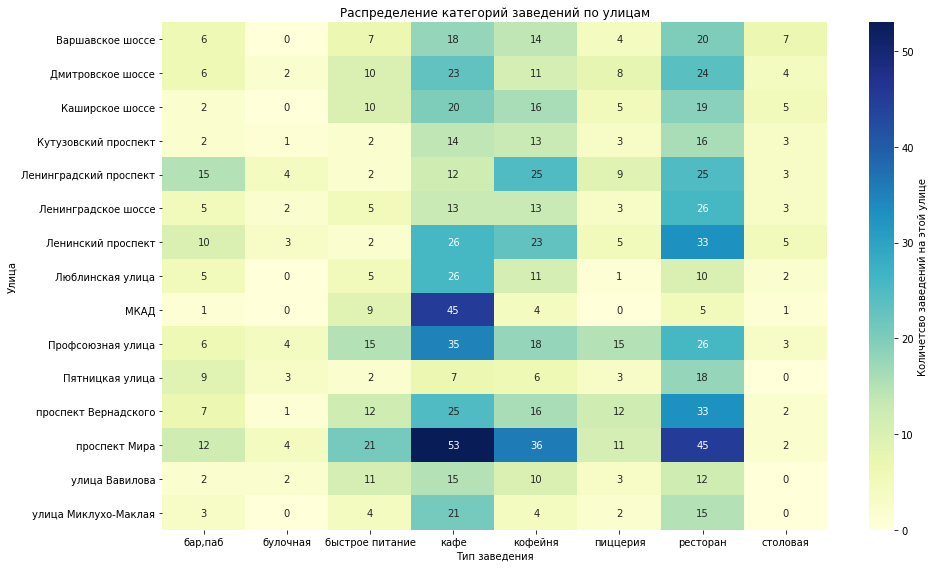

In [53]:
plt.figure(figsize=(14, 8))
sns.heatmap(
    pivot_street,
    annot=True, fmt=".0f", cmap="YlGnBu",
    cbar_kws={'label': 'Количетсво заведений на этой улице'}
)

plt.title("Распределение категорий заведений по улицам")
plt.xlabel("Тип заведения")
plt.ylabel("Улица")
plt.tight_layout()
plt.show()

Больше всего заведений распологается на улице под названием "Проспект Мира", здесь их количество намного превышает, количество заведений на других улицах 

In [54]:
zd = data.groupby(['street'])[['name']].count().reset_index().rename(columns={'street':'Улица','name':'Количетсво заведений на этой улице'})
kd = zd[zd['Количетсво заведений на этой улице']==1]
display(kd)

,Улица,Количетсво заведений на этой улице
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [55]:
only_one = data.query("street in @kd['Улица']")
display(only_one)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,Не известно,Не известно,NaN,NaN,0,NaN,Прибрежный проезд,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,Не известно,Не известно,NaN,NaN,1,NaN,парк Левобережный,False
58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,Не известно,Не известно,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,Не известно,Не известно,NaN,NaN,0,90.0,улица Шкулёва,False
8294,wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,Не известно,NaN,NaN,0,NaN,улица Артюхиной,False
8317,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,Не известно,Не известно,NaN,NaN,1,NaN,Кузьминская улица,False
8379,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,Не известно,Не известно,NaN,NaN,1,40.0,Новороссийская улица,False


Явных признаков по которым можно сказать что эти заведения похожи нет, но о многих из них отсутсвует большое количество информации.

In [56]:
rd = data.groupby(['district'])[['middle_avg_bill']].median().reset_index().rename(columns={'district':'Административный округ', 'middle_avg_bill':'Медиана среднего чека'})
display(rd)

,Административный округ,Медиана среднего чека
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [57]:
from folium import Map, Choropleth, GeoJson, GeoJsonTooltip
state_geo='/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
p=Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=rd,
    columns=['Административный округ', 'Медиана среднего чека'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека',
).add_to(p)
GeoJson(
    state_geo,
    name="Районы",
    tooltip=GeoJsonTooltip(
        fields=["name"],
        aliases=["Район:"],  
        localize=True
    )
).add_to(p)
p

Самые большие значения средних чеков можно отметить в Центральном и Западном административных округах, они равны, также можно отметить что значения чеков больше в округах которые находятся рядом сразу и с Центральным и с Западным, это: Северо-Западный и Северный административные округа. 

Теперь нужно изучить данные о кофейнях в Москве, так как заказчик хочет открыт ьновую доступную кофейню.

In [58]:
ed=data[data['category'] == 'кофейня']
display(ed)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,Не известно,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,Не известно,Не известно,NaN,NaN,1,NaN,парк Левобережный,False
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,Не известно,Не известно,NaN,NaN,1,46.0,Коровинское шоссе,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,Не известно,Не известно,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,Не известно,Не известно,NaN,NaN,1,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,Не известно,Не известно,NaN,NaN,0,NaN,Люблинская улица,False
8365,квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,Не известно,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,Волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,Не известно,Не известно,NaN,NaN,0,NaN,Грайвороновская улица,False
8385,cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,Не известно,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False


Для начала найдем все кофейни в датасете всего их 1413. Далее будем использовать эту таблицу так как в ней мы оставили заведения только из категории кофейни.

In [59]:
od = (ed.groupby('district')[['name']].count().reset_index().rename(columns={'district': 'Административный округ','name': 'Количество кофеен'}))
display(od)

,Административный округ,Количество кофеен
0,Восточный административный округ,105
1,Западный административный округ,150
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


In [60]:
h=Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=od,
    columns=['Административный округ', 'Количество кофеен'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен в районе',
).add_to(h)
GeoJson(
    state_geo,
    name="Районы",
    tooltip=GeoJsonTooltip(
        fields=["name"],
        aliases=["Район:"],  
        localize=True
    )
).add_to(h)
h

Явное большинство кофеен на распологаются в Центральном административном округе. Можно обратить внимание что по данным датасета их 428.

In [61]:
ud = (ed.groupby('street')[['name']].count().reset_index().rename(columns={'street': 'Улица','name': 'Количество кофеен'}).sort_values(by = 'Количество кофеен', ascending = False).head(15))
display(ud)

,Улица,Количество кофеен
476,проспект Мира,36
212,Ленинградский проспект,25
214,Ленинский проспект,23
331,Профсоюзная улица,18
474,проспект Вернадского,16
178,Каширское шоссе,16
120,Варшавское шоссе,14
207,Кутузовский проспект,13
284,Новослободская улица,13
213,Ленинградское шоссе,13


In [62]:
jd = ed.merge(ud, left_on='street', right_on='Улица', how='inner')
display(jd)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,Улица,Количество кофеен
0,сахарочек,кофейня,"Москва, Дмитровское шоссе, 107А, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.879256,37.538444,4.5,средние,Цена чашки капучино:100–200 ₽,NaN,150.0,0,120.0,Дмитровское шоссе,False,Дмитровское шоссе,11
1,take and wake,кофейня,"Москва, Дмитровское шоссе, 100, стр. 2",Северный административный округ,пн-пт 08:30–18:30,55.882019,37.546174,4.5,низкие,Цена чашки капучино:150–210 ₽,NaN,180.0,1,120.0,Дмитровское шоссе,False,Дмитровское шоссе,11
2,шеф бургер,кофейня,"Москва, Дмитровское шоссе, 116Д",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.901734,37.548499,4.1,средние,Средний счёт:300 ₽,300.0,NaN,1,120.0,Дмитровское шоссе,False,Дмитровское шоссе,11
3,шоколадница,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.1,Не известно,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN,Дмитровское шоссе,False,Дмитровское шоссе,11
4,one price coffee,кофейня,"Москва, Дмитровское шоссе, 163А, корп. 1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909838,37.541526,4.0,Не известно,Не известно,NaN,NaN,1,350.0,Дмитровское шоссе,False,Дмитровское шоссе,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,синнабон,кофейня,"Москва, Варшавское шоссе, 140с3",Южный административный округ,"ежедневно, 10:00–22:00",55.611914,37.607937,4.1,Не известно,Не известно,NaN,NaN,1,NaN,Варшавское шоссе,False,Варшавское шоссе,14
236,cofix,кофейня,"Москва, Варшавское шоссе, 140",Южный административный округ,"ежедневно, 09:00–22:00",55.611885,37.607043,4.1,Не известно,Не известно,NaN,NaN,1,NaN,Варшавское шоссе,False,Варшавское шоссе,14
237,кофейня,кофейня,"Москва, Варшавское шоссе, вл132/1",Южный административный округ,"ежедневно, 08:00–21:00",55.621149,37.609206,4.1,Не известно,Не известно,NaN,NaN,0,NaN,Варшавское шоссе,False,Варшавское шоссе,14
238,подоконник,кофейня,"Москва, Варшавское шоссе, 9, стр. 1",Южный административный округ,пн-пт 09:00–17:45,55.698944,37.624265,5.0,Не известно,Цена чашки капучино:150–180 ₽,NaN,165.0,0,180.0,Варшавское шоссе,False,Варшавское шоссе,14


In [63]:
moscow_lat, moscow_lng = 55.751244, 37.618423
s = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(s)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
jd.apply(create_clusters, axis=1)
s

Также из интереса были изучены улицы на которых находятся наибольшее количество кофеен. С помощью кластеров они отобразились на карте. Можно отметить что больше всего кофеен распологаются на большим улицах, таких как: проспект Мира, Ленинградский и Ленинский проспекты

In [64]:
yd = (ed.groupby('street')[['name']].count().reset_index().rename(columns={'street': 'Улица','name': 'Количество кофеен'}))
yd_only_one= yd[yd['Количество кофеен']==1]
display(yd_only_one)

,Улица,Количество кофеен
0,1-й Волоколамский проезд,1
1,1-й Колобовский переулок,1
2,1-й Магистральный тупик,1
3,1-й Нагатинский проезд,1
4,1-й Неопалимовский переулок,1
...,...,...
620,улица Чаянова,1
623,улица Шкулёва 4,1
625,улица Щипок,1
626,улица Юных Ленинцев,1


In [65]:
kd = ed.merge(yd_only_one, left_on='street', right_on='Улица', how='inner')
display(kd)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,Улица,Количество кофеен
0,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,Не известно,Не известно,NaN,NaN,1,NaN,парк Левобережный,False,парк Левобережный,1
1,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,Не известно,Не известно,NaN,NaN,1,NaN,улица Дыбенко,False,улица Дыбенко,1
2,royal coffee,кофейня,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880622,37.448529,3.1,Не известно,Не известно,NaN,NaN,0,148.0,Правобережная улица,False,Правобережная улица,1
3,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False,Угличская улица,1
4,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,Не известно,Не известно,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False,ландшафтный заказник Лианозовский,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,хлеб,кофейня,"Москва, Саратовская улица, 22",Юго-Восточный административный округ,"ежедневно, 08:30–20:00",55.716017,37.747125,4.2,Не известно,Не известно,NaN,NaN,0,NaN,Саратовская улица,False,Саратовская улица,1
367,baer coffee,кофейня,"Москва, Окская улица, 1, корп. 1",Юго-Восточный административный округ,пн 00:00–21:00; вт-сб 09:00–21:00; вс 00:00–21:00,55.711757,37.751269,4.4,низкие,Цена чашки капучино:120–180 ₽,NaN,150.0,0,80.0,Окская улица,False,Окская улица,1
368,bonjour,кофейня,"Москва, Шоссейная улица, 8",Юго-Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 08:00–21:00",55.689958,37.725969,4.7,средние,Цена чашки капучино:130–190 ₽,NaN,160.0,0,NaN,Шоссейная улица,False,Шоссейная улица,1
369,шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,Не известно,Не известно,NaN,NaN,0,NaN,Грайвороновская улица,False,Грайвороновская улица,1


In [66]:
moscow_lat, moscow_lng = 55.751244, 37.618423
k = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(k)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
kd.apply(create_clusters, axis=1)
k

Помимо улиц с наибольшим числом кофеен на них, были найдены улицы на которых находятся по одной кофейне. Они также отображены на карте с помощью кластеров. По большей части это наоборот небольшие улочки, которые находятся недалеко от домов. 

In [67]:
ud=ed[ed['is_24_7']=='True']
display(ud)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


Кофейни которые работают круглосуточно в датасете не найдены

In [68]:
ed['rating'].min()

1.4

In [69]:
ed['rating'].max()

5.0

In [70]:
ed['rating'].median()

4.3

Разница в рейтингах кофеен огромна от 1,4 до 5. При этом можно отметить что кофейни с низким рейтингом не так много, так как медианное значение равно 4,3.

In [71]:
wd=ed.groupby(['name', 'chain'])[['rating']].median().reset_index().rename(columns={'name':'Название заведения', 'chain':'Сетевое заведение', 'rating':'Рейтинг'})
display(wd)

,Название заведения,Сетевое заведение,Рейтинг
0,18 грамм,1,4.4
1,2-й этаж,0,4.3
2,2046,0,4.8
3,22 акра кофе&хлеб,0,4.4
4,42 coffee shop,0,4.4
...,...,...,...
827,это кофейня,0,4.4
828,этокофе,0,4.7
829,эшторил,0,4.2
830,я кофе,0,3.8


Также были изучены рейтинги всех заведений этой категории, как сетевые, так и не сетевые.

In [72]:
td=ed.groupby('district')[['rating']].mean().reset_index().rename(columns={'district':'Административный округ', 'rating':'Средний рейтинг'})
display(td)

,Административный округ,Средний рейтинг
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


In [73]:
from folium import Map, Choropleth, GeoJson, GeoJsonTooltip
state_geo='/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
g=Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=td,
    columns=['Административный округ', 'Средний рейтинг'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений',
).add_to(g)
GeoJson(
    state_geo,
    name="Районы",
    tooltip=GeoJsonTooltip(
        fields=["name"],
        aliases=["Район:"],  
        localize=True
    )
).add_to(g)
g

Если же говорить о среднем рейтинге кофеен по административным округам. Но средний рейтинг по районам не сильно отличается самый низкий в Западном административном округе, а самые высокие рейтинги в Центральном и Северо-Западном

In [74]:
ed['middle_coffee_cup'].min()

60.0

In [75]:
ed['middle_coffee_cup'].max()

1568.0

In [76]:
ed['middle_coffee_cup'].median()

170.0

Разброс цен на одну чашку капучино варируется от 60 до 1568 рублей, если же брать медианное значение, так как у многих кофеен отсутвуют эти данные, оно равно 170 рублям.

In [77]:
dd=ed.groupby('district')[['middle_coffee_cup']].median().reset_index().rename(columns={'district':'Административный округ', 'middle_coffee_cup':'Средняя цена одной чашки капучино'})
display(dd)

,Административный округ,Средняя цена одной чашки капучино
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


In [78]:
from folium import Map, Choropleth, GeoJson, GeoJsonTooltip
state_geo='/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
y=Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=dd,
    columns=['Административный округ', 'Средняя цена одной чашки капучино'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя цена одной чашки капучино',
).add_to(y)
GeoJson(
    state_geo,
    name="Районы",
    tooltip=GeoJsonTooltip(
        fields=["name"],
        aliases=["Район:"],  
        localize=True
    )
).add_to(y)
y

Средняя цена за чашку капучино не сильно различается. Оптимальным вариантом цены за чашку кофе будет 150-170 рублей, но также важно что нужно отталкиваться от того, где будет распологаться кофейня.

Я бы посоветовал открыть кофейню в Западном административном округе, так как в нем в целом большое количество заведений общественного питания, в том числе и кофеен. Но важно заметить что при условии того что число кофеен достаточно большое их средний рейтинг является самым низким, что говорит нам о том что им необходимо хорошее заведение. Также важно отметить что средняя цена одной чашки капучино равна 189 рублям, что тоже очень значительно даже для Москвы, это 3 по величине средняя стоимость. Такая высокая средняя цена позволяет в самом начале взять за основу больший диапозон цен. Также в качестве расположения я бы посоветовал расматривать относительно небольшие улицы, на которых находятся максимум 1-2 кофейни, а сами улицы распологаются рядом с жилыми домами чтобы они были в пешей достурности для посетителей кофейни. Наример: улица Горбунова, Партизанская улица или Ельнинская улица. Также классным дополнением для кофейни будет условие что она будет круглосуточно, так как таких кофеен еще нет в Москве

https://disk.yandex.ru/client/disk/Яндекс%20Практикум